In [1]:
import pandas as pd
from embeddings_utils import add_node_types, tsne_embeddings
import networkx as nx
import json
import numpy as np

In [2]:
nodes_all =  pd.read_csv('data/nodes_with_patients.csv')
edges_all =  pd.read_csv('data/edges_with_patients.csv')

In [3]:
nodes_types = nodes_all['type'].unique()
print(nodes_types)

['Protein' 'Chemical' 'Variant (SNP)' 'Gene' 'GO' 'Anatomy' 'Vaccine'
 'Glycan' 'Phenotype' 'Disease' 'Pathway' 'Cell' 'Genomic feature'
 'Parasite lifecycle' 'NCI thesaurus' 'Species' 'Medical action'
 'Human developmental stage' 'Food' 'Environment' 'Neuro behaviour'
 'Chromosome' 'Protein modification' 'Experimental factor'
 'Environmental exposure' 'Trait' 'Plant'
 'Dictyostelium discoideum anatomy' 'Mouse pathology'
 'General medical science' 'Fungal anatomy' 'Mental disease'
 'Mental functioning' 'Infectious disease' 'Adverse events' 'Basic formal'
 'Person' 'Article']


In [4]:
desired_nodes = ['Phenotype', 'Disease', 'Person']
filtered_nodes = nodes_all[nodes_all['type'].isin(desired_nodes)]
filtered_nodes.head()

,name,type
26,<http://purl.obolibrary.org/obo/HP_0025537>,Phenotype
27,<http://purl.obolibrary.org/obo/MONDO_0019180>,Disease
37,<http://purl.obolibrary.org/obo/MONDO_0007027>,Disease
73,<http://purl.obolibrary.org/obo/MONDO_0004335>,Disease
83,<http://purl.obolibrary.org/obo/MONDO_0009781>,Disease


In [5]:
filtered_nodes.value_counts(filtered_nodes['type'])

type
Disease      26899
Phenotype    19645
Person        7801
Name: count, dtype: int64

In [6]:
# these two nodes are the root nodes of all patients and they define their gender
gender_nodes = ['<http://purl.obolibrary.org/obo/NCIT_C20197>', '<http://purl.obolibrary.org/obo/NCIT_C16576>']
filtered_nodes = filtered_nodes[~filtered_nodes['name'].isin(gender_nodes)]


In [7]:
edges_with_type = add_node_types(edges_all, nodes_all)
edges_with_type.head()

,subject,predicate,object,x_type,y_type
0,<http://purl.obolibrary.org/obo/HP_0003392>,Phenotype of,<http://purl.obolibrary.org/obo/MONDO_0011091>,Phenotype,Disease
1,<http://purl.obolibrary.org/obo/VO_0016809>,Immunizes against pathogen,<http://purl.obolibrary.org/obo/NCBITaxon_1717>,Vaccine,Species
2,<http://purl.obolibrary.org/obo/CHEBI_174043>,Subclassof,<http://purl.obolibrary.org/obo/CHEBI_25418>,Chemical,Chemical
3,<http://purl.obolibrary.org/obo/CHEBI_112546>,Subclassof,<http://purl.obolibrary.org/obo/CHEBI_52898>,Chemical,Chemical
4,<https://reactome.org/content/detail/R-HSA-179...,Has participant,<http://www.ncbi.nlm.nih.gov/gene/5906>,Pathway,Gene


In [12]:
# Define the desired (x_type, y_type) pairs
desired_pairs = [
    ("Phenotype", "Disease"),
    ("Phenotype", "Phenotype"),
    ("Disease", "Phenotype"),
    ("Disease", "Disease"),
    ("Person", "Disease"),
    ("Person", "Phenotype")
]

# Filter the DataFrame
patients_edges = edges_with_type[edges_with_type[["x_type", "y_type"]].apply(tuple, axis=1).isin(desired_pairs)]
patients_edges.value_counts(patients_edges['x_type'])

x_type
Disease      501638
Phenotype    492066
Person        71347
Name: count, dtype: int64

In [13]:
patients_edges[patients_edges["predicate"] == "Subclassof"]

,subject,predicate,object,x_type,y_type
13,<http://purl.obolibrary.org/obo/MONDO_0021154>,Subclassof,<http://purl.obolibrary.org/obo/MONDO_0005093>,Disease,Disease
57,<http://purl.obolibrary.org/obo/HP_0002599>,Subclassof,<http://purl.obolibrary.org/obo/HP_0002346>,Phenotype,Phenotype
313,<http://purl.obolibrary.org/obo/MONDO_0014596>,Subclassof,<http://purl.obolibrary.org/obo/MONDO_0018838>,Disease,Disease
443,<http://purl.obolibrary.org/obo/MONDO_0000156>,Subclassof,<http://purl.obolibrary.org/obo/MONDO_0018234>,Disease,Disease
572,<http://purl.obolibrary.org/obo/MONDO_0010702>,Subclassof,<http://purl.obolibrary.org/obo/MONDO_0100500>,Disease,Disease
...,...,...,...,...,...
5317894,<http://purl.obolibrary.org/obo/MONDO_1010797>,Subclassof,<http://purl.obolibrary.org/obo/MONDO_1011493>,Disease,Disease
5317936,<http://purl.obolibrary.org/obo/HP_0000580>,Subclassof,<http://purl.obolibrary.org/obo/HP_0007703>,Phenotype,Phenotype
5318059,<http://purl.obolibrary.org/obo/MONDO_0019584>,Subclassof,<http://purl.obolibrary.org/obo/MONDO_0019447>,Disease,Disease
5318072,<http://purl.obolibrary.org/obo/HP_0005943>,Subclassof,<http://purl.obolibrary.org/obo/HP_0002093>,Phenotype,Phenotype


In [14]:
desired_edges = ['Has phenotype', 'Has disease', 'Subclassof']
filtered_edges = patients_edges[(patients_edges["predicate"].isin(desired_edges))]
filtered_edges.groupby(['x_type', 'y_type']).size()

x_type     y_type   
Disease    Disease       45251
           Phenotype    453261
Person     Disease        7799
           Phenotype     63548
Phenotype  Phenotype     25852
dtype: int64

In [15]:
filtered_edges[filtered_edges["subject"] == "<https://pubmed.ncbi.nlm.nih.gov/15266616?100>"]

,subject,predicate,object,x_type,y_type
5676951,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has disease,<http://purl.obolibrary.org/obo/MONDO_0007838>,Person,Disease
5684750,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0000348>,Person,Phenotype
5684751,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0011220>,Person,Phenotype
5684752,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0000337>,Person,Phenotype
5684753,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0002553>,Person,Phenotype
5684754,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0010487>,Person,Phenotype
5684755,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0001763>,Person,Phenotype
5684756,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has phenotype,<http://purl.obolibrary.org/obo/HP_0000078>,Person,Phenotype


In [ ]:
patients_data = filtered_edges[
    (filtered_edges['x_type'] == 'Person') & (filtered_edges['y_type'] == 'Disease') |
    (filtered_edges['x_type'] == 'Person') & (filtered_edges['y_type'] == 'Phenotype')
]
# Group by patients 
patient_integrated = patients_data.groupby('subject')['object'].apply(list).to_dict()

with open("data/patients.json", "w", encoding="utf-8") as output_file:
    json.dump(patient_integrated, output_file, indent=4, ensure_ascii=False)

In [ ]:

disease_patient_edges = filtered_edges[
    (filtered_edges['x_type'] == 'Person') & (filtered_edges['y_type'] == 'Disease')
]
# Group by the 'y_type' column
grouped_patients = disease_patient_edges.groupby('y_type')

# Group by 'y_id' (disease) and count unique 'x_id' (patients)
disease_patient_counts = disease_patient_edges.groupby('object')['subject'].nunique()

# Display the result
print(disease_patient_counts)

object
<http://purl.obolibrary.org/obo/MONDO_0005338>     5
<http://purl.obolibrary.org/obo/MONDO_0007041>     2
<http://purl.obolibrary.org/obo/MONDO_0007055>    13
<http://purl.obolibrary.org/obo/MONDO_0007057>     1
<http://purl.obolibrary.org/obo/MONDO_0007064>     2
                                                  ..
<http://purl.obolibrary.org/obo/MONDO_0971013>    17
<http://purl.obolibrary.org/obo/MONDO_0971014>     8
<http://purl.obolibrary.org/obo/MONDO_0971015>     4
<http://purl.obolibrary.org/obo/MONDO_0971044>     3
<http://purl.obolibrary.org/obo/MONDO_0971172>    61
Name: subject, Length: 489, dtype: int64


In [120]:
# Group by 'y_id' (disease) and collect 'x_id' (patients) into lists
disease_patient_mapping = (
    disease_patient_edges.groupby('object')['subject']
    .apply(list)
    .to_dict()
)

# Display the result
disease_patient_mapping

{'<http://purl.obolibrary.org/obo/MONDO_0005338>': ['<https://pubmed.ncbi.nlm.nih.gov/26162006?Individual_I_1>',
  '<https://pubmed.ncbi.nlm.nih.gov/26162006?Individual_II_10>',
  '<https://pubmed.ncbi.nlm.nih.gov/26162006?Individual_II_4>',
  '<https://pubmed.ncbi.nlm.nih.gov/26162006?Individual_II_5>',
  '<https://pubmed.ncbi.nlm.nih.gov/26162006?Individual_II_7>'],
 '<http://purl.obolibrary.org/obo/MONDO_0007041>': ['<https://pubmed.ncbi.nlm.nih.gov/23546041?Patient_1>',
  '<https://pubmed.ncbi.nlm.nih.gov/23546041?Patient_2>'],
 '<http://purl.obolibrary.org/obo/MONDO_0007055>': ['<https://pubmed.ncbi.nlm.nih.gov/21683322?AD_Family_20>',
  '<https://pubmed.ncbi.nlm.nih.gov/21683322?AD_Family_21>',
  '<https://pubmed.ncbi.nlm.nih.gov/21683322?AD_Family_22_a>',
  '<https://pubmed.ncbi.nlm.nih.gov/21683322?AD_Family_22_b>',
  '<https://pubmed.ncbi.nlm.nih.gov/21683322?AD_Family_22_c>',
  '<https://pubmed.ncbi.nlm.nih.gov/21683322?AD_Family_23>',
  '<https://pubmed.ncbi.nlm.nih.gov/2168

In [121]:
G = nx.DiGraph()

# Add nodes with attributes
for idx, row in filtered_nodes.iterrows():
    G.add_node(row['name'], node_type=row['type'])

# Add edges with attributes
for idx, row in filtered_edges.iterrows():
    G.add_edge(row['subject'], row['object'], relation=row['predicate'])


In [122]:
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())


Number of nodes: 54343
Number of edges: 595711


In [123]:

# Load JSON file as a dictionary
with open('phenotype_embeddings.json', 'r') as json_file:
    phenotype_embeddings = json.load(json_file)

In [124]:

def calculate_patient_embedding(G, phenotype_embeddings):
    """
    Calculates the embedding of each patient by averaging the embeddings 
    of their associated phenotypes.

    Parameters:
        G (nx.DiGraph): A NetworkX graph where nodes have 'node_type' attributes.
        phenotype_embeddings (dict): A dictionary mapping phenotype nodes 
                                     to their embedding arrays.

    Returns:
        dict: A dictionary mapping each patient node to its calculated embedding.
    """
    patient_embeddings = {}

    for node in G.nodes:
        if G.nodes[node].get('node_type') == 'Person':  # Safely check for 'Person'
            embeddings = []

            # Collect embeddings of all associated phenotypes
            for phen in G.successors(node):
                if G.nodes[phen].get('node_type') == 'Phenotype' and phen in phenotype_embeddings:
                    embeddings.append(phenotype_embeddings[phen])

            # Calculate the average embedding if any embeddings were found
            if embeddings:
                avg_embedding = np.mean(embeddings, axis=0)
            else:
                avg_embedding = np.zeros_like(next(iter(phenotype_embeddings.values())))

            patient_embeddings[node] = avg_embedding

    return patient_embeddings


In [125]:
patient_embeddings = calculate_patient_embedding(G, phenotype_embeddings)

In [126]:
patient_embeddings

{'<https://pubmed.ncbi.nlm.nih.gov/15266616?100>': array([ 1.73361425e-01, -4.16044146e-04,  1.57145885e-01, -1.21702402e-01,
         2.33719678e-01, -1.48345586e-01,  1.06542165e-01, -3.09778867e-02,
         9.06004166e-02,  2.51745322e-01, -1.81531022e-01,  1.24940043e-01,
        -2.26031332e-01, -1.76027217e-01,  7.40695666e-02,  1.00124519e-01,
         7.44212120e-02,  4.83032312e-01, -8.11129804e-02,  2.85022044e-01,
        -3.39693800e-02,  6.49622562e-02,  1.38718530e-01,  7.90007905e-03,
         1.31449071e-02,  2.55551587e-02,  8.01400162e-02,  1.73133397e-01,
        -2.37835419e-01,  1.65322571e-01, -5.97299630e-02,  2.83979814e-02,
        -2.32488651e-01,  7.43051469e-02, -1.86933724e-01,  1.50790377e-01,
         2.42243547e-01, -1.17790722e-01,  1.29906336e-01, -1.71841008e-01,
         4.81807345e-02,  2.70498005e-01, -2.50246844e-01, -1.82778610e-01,
        -1.13913167e-01,  2.05325699e-01,  2.48805176e-01, -1.89971015e-01,
        -8.90399641e-02,  4.21104063e-

In [150]:
zero_count = 0
zeros = []
for patient, embedding in patient_embeddings.items():
    if np.all(embedding == 0):
        zero_count += 1
        zeros.append(patient)

print(f"Number of patients with all-zero embeddings: {zero_count}")
print(f"patients with all-zero embeddings: {zeros[0:5]}")

Number of patients with all-zero embeddings: 80
patients with all-zero embeddings: ['<https://pubmed.ncbi.nlm.nih.gov/36446582?Kutkowska_Kazmierczak2021_P15>', '<https://pubmed.ncbi.nlm.nih.gov/36446582?Low_2016_P25_22>', '<https://pubmed.ncbi.nlm.nih.gov/36446582?VanDongen2019_P5>', '<https://pubmed.ncbi.nlm.nih.gov/36446582?VanDongen2019_P7>', '<https://pubmed.ncbi.nlm.nih.gov/36182950?Patient_73>']


In [129]:
filtered_edges[filtered_edges["subject"] == "<http://purl.obolibrary.org/obo/NCIT_C20197>"]

,subject,predicate,object,x_type,y_type


In [ ]:
keys_to_remove = [patient for patient in patient_embeddings if patient in zeros]

for key in keys_to_remove:
    del patient_embeddings[key]


In [131]:
patient_embeddings

{'<https://pubmed.ncbi.nlm.nih.gov/15266616?100>': array([ 1.73361425e-01, -4.16044146e-04,  1.57145885e-01, -1.21702402e-01,
         2.33719678e-01, -1.48345586e-01,  1.06542165e-01, -3.09778867e-02,
         9.06004166e-02,  2.51745322e-01, -1.81531022e-01,  1.24940043e-01,
        -2.26031332e-01, -1.76027217e-01,  7.40695666e-02,  1.00124519e-01,
         7.44212120e-02,  4.83032312e-01, -8.11129804e-02,  2.85022044e-01,
        -3.39693800e-02,  6.49622562e-02,  1.38718530e-01,  7.90007905e-03,
         1.31449071e-02,  2.55551587e-02,  8.01400162e-02,  1.73133397e-01,
        -2.37835419e-01,  1.65322571e-01, -5.97299630e-02,  2.83979814e-02,
        -2.32488651e-01,  7.43051469e-02, -1.86933724e-01,  1.50790377e-01,
         2.42243547e-01, -1.17790722e-01,  1.29906336e-01, -1.71841008e-01,
         4.81807345e-02,  2.70498005e-01, -2.50246844e-01, -1.82778610e-01,
        -1.13913167e-01,  2.05325699e-01,  2.48805176e-01, -1.89971015e-01,
        -8.90399641e-02,  4.21104063e-

In [149]:
import json

# Convert ndarray to list for JSON serialization
serializable_embeddings = {
    key: value.tolist() if isinstance(value, np.ndarray) else value
    for key, value in patient_embeddings.items()
}

# Save to JSON file
with open('patients_embeddings.json', 'w') as json_file:
    json.dump(serializable_embeddings, json_file, indent=4)

In [133]:
from sklearn.manifold import TSNE
def tsne_embeddings(node_embeddings):
    # Assuming embedding_values is a list of embedding vectors
    embedding_values_list = list(node_embeddings.values())
    embedding_values = np.array(embedding_values_list) 
    # Reduce to 2D
    tsne = TSNE(n_components=2, random_state=42)
    embeddings_2d = tsne.fit_transform(embedding_values)
    return embeddings_2d

In [134]:
patients_2d_embeddings = tsne_embeddings(patient_embeddings)

In [102]:
patients_2d_embeddings

array([[-82.22317  ,  61.929214 ],
       [-82.22317  ,  61.929214 ],
       [-28.106253 , -27.616264 ],
       ...,
       [ 14.454279 , -20.787813 ],
       [ 34.766754 ,   2.1979723],
       [-31.882723 , -34.929394 ]], dtype=float32)

In [135]:
disease_patient_edges.head()

,subject,predicate,object,x_type,y_type
5676951,<https://pubmed.ncbi.nlm.nih.gov/15266616?100>,Has disease,<http://purl.obolibrary.org/obo/MONDO_0007838>,Person,Disease
5676952,<https://pubmed.ncbi.nlm.nih.gov/15266616?101>,Has disease,<http://purl.obolibrary.org/obo/MONDO_0007838>,Person,Disease
5676953,<https://pubmed.ncbi.nlm.nih.gov/15266616?102>,Has disease,<http://purl.obolibrary.org/obo/MONDO_0007838>,Person,Disease
5676954,<https://pubmed.ncbi.nlm.nih.gov/15266616?103>,Has disease,<http://purl.obolibrary.org/obo/MONDO_0007838>,Person,Disease
5676955,<https://pubmed.ncbi.nlm.nih.gov/15266616?104>,Has disease,<http://purl.obolibrary.org/obo/MONDO_0007838>,Person,Disease


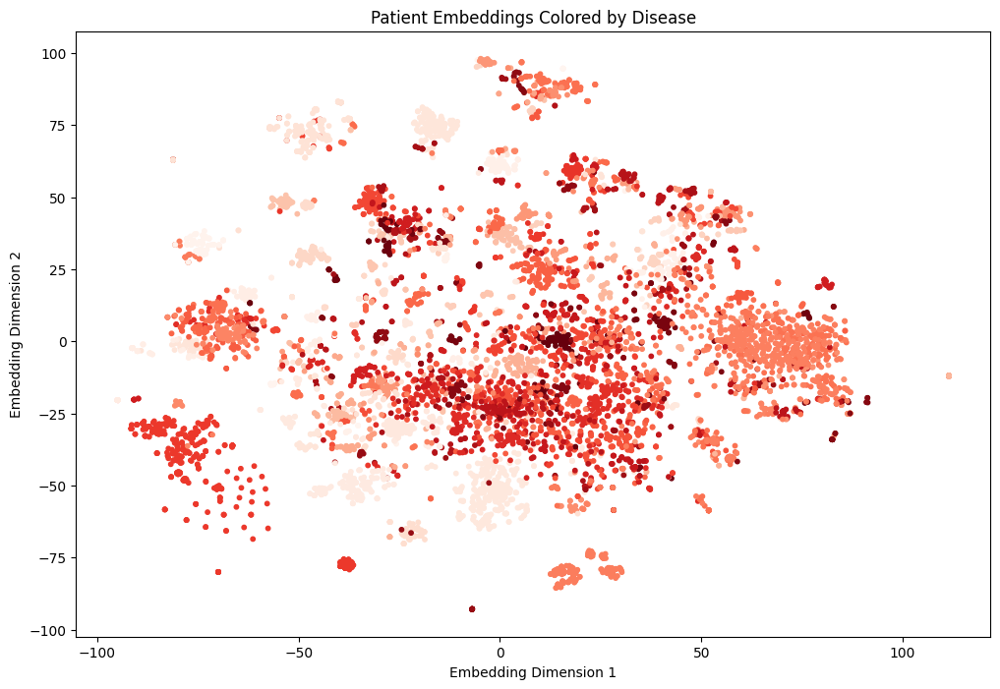

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assign a unique color to each disease
disease_to_color = {disease: idx for idx, disease in enumerate(disease_patient_mapping.keys())}

# Create a color array for patients
patient_colors = []
for patient, disease in disease_patient_edges[['subject', 'object']].values:
    patient_colors.append(disease_to_color[disease])

# Normalize colors for plotting
num_diseases = len(disease_to_color)
normalized_colors = np.array(patient_colors) / num_diseases

# Plot the embeddings
plt.figure(figsize=(12, 8))
scatter = plt.scatter(
    patients_2d_embeddings[:, 0],  # Assuming this contains patient embeddings
    patients_2d_embeddings[:, 1],
    c=normalized_colors,  # Color based on disease
    cmap='Reds',  # Colormap for distinct colors
    s=10  # Point size
)

# Add plot title and labels
plt.title("Patient Embeddings Colored by Disease")
plt.xlabel("Embedding Dimension 1")
plt.ylabel("Embedding Dimension 2")
plt.show()
